# SI221 - TP PCA & K-means

### Données

Nous allons travailler sur des images satellitaire: celles-ci sont capturées via différent capteurs, chacun correspondant à un domaine de longueur d'ondes. Nous avons donc, pour chaque image, un certain nombre de *canaux* - chacun correspondant à un *domaine spectral*. 

- Données SPOT sur Tarascon: La taille du pixel est de 20m. Il y a 3 canaux: 
    - 0.50-0.59 $\mu$
    - 0.61-0.68 $\mu$
    - 0.78-0.89 $\mu$
    
- Données LANDSAT sur Tarascon: La taille du pixel est de 30m. Il y a 8 canaux:
    - 0.45-0.52 $\mu$       
    - 0.52-0.60 $\mu$     
    - 0.63-0.69 $\mu$
    - 0.75-0.90 $\mu$ (Proche InfraRouge : PIR)     
    - 2.08-2.35 $\mu$ (Moyen InfraRouge : MIR)    
    - 10.40-12.50 $\mu$ (infra rouge thermique)      
    - 1.55-1.75 $\mu$ (Moyen InfraRouge : MIR)     
    - 0.52-0.90 $\mu$ (panchromatique)   
    
- Données LANDSAT sur Kedougou: La taille du pixel est de 30m; mais, à la différence des données acquises sur Tarascon, il y a un problème d’acquisition de données inhérent au capteur. Il y a ici 6 canaux:
    - 0.45-0.52 $\mu$
    - 0.52-0.60 $\mu$
    - 0.63-0.69 $\mu$
    - 0.76-0.90 $\mu$
    - 2.08-2.35 $\mu$
    - 1.55-1.75 $\mu$

### PCA

Le recours à l’ACP va permettre de réduire la dimension de l’espace de représentation et ici de réduire le nombre de canaux nécessaires pour conserver l’essentiel de l’information. De manière générale, le but de l’ACP est de visualiser dans un espace de plus petite dimension les proximités entre les observations (ici les pixels) et ainsi les corrélation entre les variables (les valeurs des pixels sur les différents canaux).  

**Rappel sur l'ACP**: Avec $N$ individus, pour lesquels on dispose de $p$ caractéristiques (ce qui veut dire que son vecteur est de dimension $p$), on notera $\mathbf{x}^i_k$ la $k$ième caractéristique de l'individu $i$. On note donc $\mathbf{X}$ la matrice dans laquelle chaque ligne est constituée par un individu et chaque colonne représente une variable. 

L'ACP est constituée par les étapes suivantes :
- Centrage et réduction des données: Notant $m_k$ et $\sigma_k$, les moyennes et écarts-type de la $k$ième variable, on notera $\mathbf{x}'^i_k=\frac{\mathbf{x}^i_k-m_k}{\sigma_k}$ la donnée centrée réduite.
- Calcul de la matrice de covariance des données centrées réduites.
- Calcul des valeurs propres $\lambda_j$ et vecteurs propres $\mathbf{u}_j$ de la matrice de covariance;
- Vérification de l'ordre des vecteurs propres selon les valeurs propres croissantes;
- Calcul des composantes principales $\mathbf{x}''^i_q$ exprimées dans la base des vecteurs propres: $$ \mathbf{x}''^i_q={\mathbf{x}'^i}^T \mathbf{u}_q $$


On obtient donc de nouvelles variables constituées par des combinaisons linéaires des anciennes. Les composantes principales contiennent une quantité d'information proportionnelle à la valeur propre correspondante. On définit ainsi le pourcentage d'inertie par $\frac{\lambda_i}{\sum_{j=1}^{p}\lambda_j}$. 

Le but premier de ce TP est **l'application du PCA (ou ACP, Analyse en composantes principales) à ces images satellitaires, ou les individus sont chaque canal de l'image, et les variables chacun des pixels**. 

In [1]:
import matplotlib.pyplot as plt
import numpy as np

Les données proviennent de fichier .mat, avec un fichier par canal. On peut commencer par travailler avec SPOT, qui n'a que 3 canaux. Commençons par charger les images et les réunir sur une même matrice.

In [2]:
from scipy.io import loadmat

def load_image(path_img):
    im_loaded = loadmat('./'+ path_img +'.mat')
    return im_loaded['imm']

In [3]:
# First image: SPOT
path_img = 'SPOT/cam'
n_bands = 3

# Let's take a look at the first channel's size
img = load_image(path_img +'1')
img

array([[29, 30, 32, ..., 43, 36, 29],
       [35, 37, 38, ..., 40, 32, 28],
       [32, 35, 34, ..., 32, 32, 34],
       ...,
       [31, 32, 32, ..., 29, 28, 26],
       [32, 33, 33, ..., 37, 31, 24],
       [33, 34, 33, ..., 39, 35, 26]], dtype=uint8)

In [4]:
img = np.zeros((img.shape[0], img.shape[1], n_bands))
# Stacking up images into the numpy array:
c = []
for i in range(n_bands):
    c.append(load_image(path_img + str(i + 1)))

for i in range(img.shape[0]):
    for j in range(img.shape[1]):
        for k in range(n_bands):
            img[i][j][k] = c[k][i][j]
img

array([[[29., 23., 29.],
        [30., 24., 29.],
        [32., 27., 30.],
        ...,
        [43., 31., 39.],
        [36., 24., 32.],
        [29., 20., 26.]],

       [[35., 28., 36.],
        [37., 29., 33.],
        [38., 29., 32.],
        ...,
        [40., 28., 38.],
        [32., 23., 30.],
        [28., 21., 25.]],

       [[32., 24., 32.],
        [35., 24., 33.],
        [34., 22., 31.],
        ...,
        [32., 25., 31.],
        [32., 25., 31.],
        [34., 24., 31.]],

       ...,

       [[31., 27., 34.],
        [32., 28., 35.],
        [32., 28., 35.],
        ...,
        [29., 19., 32.],
        [28., 18., 37.],
        [26., 17., 32.]],

       [[32., 28., 34.],
        [33., 29., 34.],
        [33., 29., 35.],
        ...,
        [37., 25., 37.],
        [31., 21., 38.],
        [24., 16., 29.]],

       [[33., 29., 34.],
        [34., 30., 34.],
        [33., 30., 35.],
        ...,
        [39., 28., 35.],
        [35., 23., 37.],
        [26., 17., 37.]]

Essayons d'abord de comprendre, en regardant les images, les caractéristiques des différents canaux et les informations qu'ils comportent. 

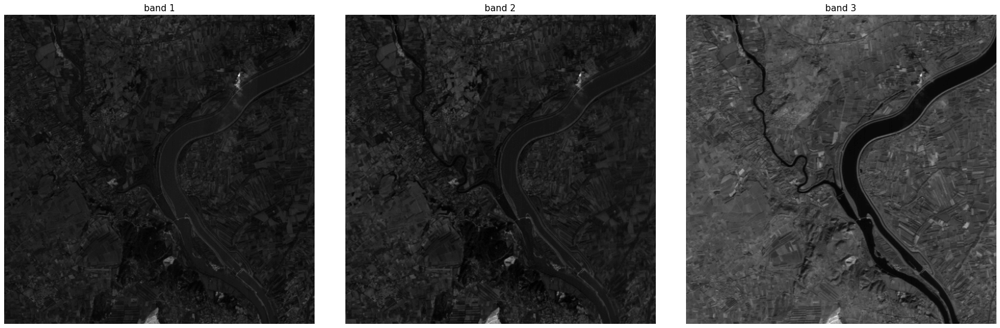

In [5]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as grid

fig,axes = plt.subplots(1,n_bands, figsize=(n_bands*10,12), sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
axes = axes.ravel()

for i in range(n_bands):
    # Use floats instead of 8-bit integers for a clearer view of the image
    axes[i].imshow(img[:,:,i] / 255, cmap='gray')
    axes[i].set_title('band '+str(i+1),fontsize=15)
    axes[i].axis('off')

Qu'observez-vous ? 

Les canaux sont ordonnés par bandes de fréquences croissantes, on observe donc des images de plus en plus claires.

Chaque image est un individu: on va d'abord redimensionner les images en vecteurs (pas besoin d'information de structure spatiale !) et on calcule la moyenne et l’écart-type de chacun de ces vecteurs pour les centrer.

In [6]:
# Reshape the image for practicality:
for i in range(n_bands):
    c[i] = c[i].reshape((1, c[i].shape[0]*c[i].shape[1]))

In [7]:
# Standardization:
m = []
s = []

for i in range(n_bands):
    m.append(np.mean(c[i]))
    s.append(np.std(c[i]))
    c[i] = (c[i] - m[i])/s[i]

**Vecteurs propres et valeurs propres**: on concatène les vecteurs centrés en une seule matrice dont on calcule la matrice de covariance, qui mesure la relation entre les images. On calcule ensuite les valeurs propres et les vecteurs propres de la matrice de covariance grâce à la fonction ```eig```. On obtient les vecteurs propres, concaténés. 

In [8]:
# Compute the covariance matrix:
mat = np.zeros((n_bands, c[0].shape[0]*c[0].shape[1]))
for i in range(n_bands):
    mat[i] = c[i]
mcov = np.cov(mat)

# Compute eigenvalues and vectors with eig:
eva, evect = np.linalg.eig(mcov)

# Check that that it worked using the formula:
test = np.dot(np.dot(evect, np.diag(eva)), np.linalg.inv(evect))
print(test)
print(mcov)

[[1.00000381 0.91281965 0.44564374]
 [0.91281965 1.00000381 0.53484936]
 [0.44564374 0.53484936 1.00000381]]
[[1.00000381 0.91281965 0.44564374]
 [0.91281965 1.00000381 0.53484936]
 [0.44564374 0.53484936 1.00000381]]


In [9]:
# Lets sort the eigenvalues to be able to choose the components by importance:
idx = np.argsort(eva)[::-1]
eva_sorted = eva[idx]
evect_sorted = evect[idx]
evect_sorted

array([[-0.61262827, -0.67782102, -0.40650371],
       [-0.47477528, -0.09558537,  0.87490106],
       [-0.63188214,  0.72898703, -0.26325436]])

**Calcul des composantes principales**: On multiplie la matrice concaténée par la matrice des vecteurs propres pour obtenir les composantes principales dans la base des vecteurs propres; ainsi, on va pouvoir trouver le sous-espace optimal pour visualiser les proximités entre les observations, et les corrélations entre les variables. 

In [10]:
# Lets get the components in separate matrices, so we can display them easily:
res = np.dot(mat.T, evect_sorted)
res = res.T

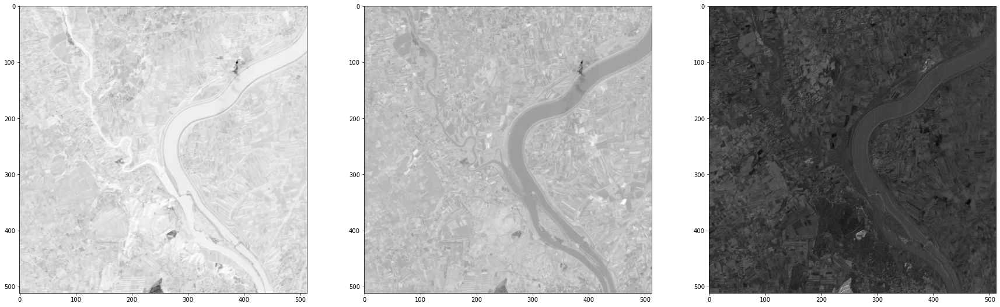

In [11]:
plt.figure(figsize=(n_bands*10, 12))

# Visualize them with imshow: 
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    plt.imshow(res[i].reshape((img.shape[0],img.shape[1])), cmap = 'gray')

*Visuellement, on constate que la première composante détecte un certain nombre d'emplacements précis, ainsi que des limites - la seconde semble détecter l'eau et les champs, et la dernière indique des artefacts verticaux sans doute liés aux capteurs*.

In [12]:
# Compute the percentage of inertia of each component:
inertia = [l/sum(eva_sorted) for l in eva_sorted]

**ACP sur les données LANDSAT sur Tarascon**: Effectuez l’analyse en composantes principales sur les données LANDSAT sur Tarascon. Affichez les images résultats. Calculez le pourcentage d’inertie associé à chaque image et interprétez qualitativement les résultats. Combien d’images faut-il garder pour conserver au moins 95% de l’information ?

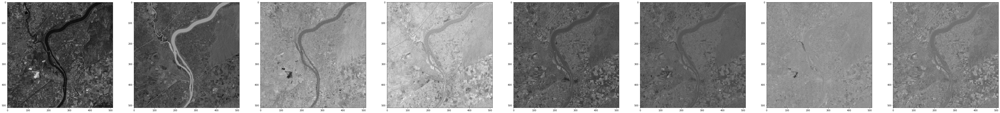

In [13]:
path_img = 'Landstat_Tarascon/landsattarasconC'
n_bands = 8

img = load_image(path_img +'1')

img = np.zeros((img.shape[0], img.shape[1], n_bands))
# Stacking up images into the numpy array:
c = []
for i in range(n_bands):
    c.append(load_image(path_img + str(i + 1)))

for i in range(img.shape[0]):
    for j in range(img.shape[1]):
        for k in range(n_bands):
            img[i][j][k] = c[k][i][j]
            
# Reshape the image for practicality:
for i in range(n_bands):
    c[i] = c[i].reshape((1, c[i].shape[0]*c[i].shape[1]))
    
# Standardization:
m = []
s = []

for i in range(n_bands):
    m.append(np.mean(c[i]))
    s.append(np.std(c[i]))
    c[i] = (c[i] - m[i])/s[i]
    
# Compute the covariance matrix:
mat = np.zeros((n_bands, c[0].shape[0]*c[0].shape[1]))
for i in range(n_bands):
    mat[i] = c[i]
mcov = np.cov(mat)

# Compute eigenvalues and vectors with eig:
eva, evect = np.linalg.eig(mcov)

# Lets sort the eigenvalues to be able to choose the components by importance:
idx = np.argsort(eva)[::-1]
eva_sorted = eva[idx]
evect_sorted = evect[idx]
evect_sorted

# Lets get the components in separate matrices, so we can display them easily:
res = np.dot(mat.T, evect_sorted)
res = res.T
    
plt.figure(figsize=(n_bands*10, 12))

# Visualize them with imshow: 
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    plt.imshow(res[i].reshape((img.shape[0],img.shape[1])), cmap = 'gray')

In [14]:
# Compute the percentage of inertia of each component:
inertia = [l/sum(eva_sorted) for l in eva_sorted]
inertia

[0.6852999602748036,
 0.16981092985227556,
 0.09404482308887196,
 0.026655188402293573,
 0.016774826455410924,
 0.0036470798765829192,
 0.0024915802799025063,
 0.0012756117698590713]

On remarque que le premier canal est beaucoup plus important que les suivants.

In [15]:
def keep(inert, perc):
    s = 0
    i = 0
    while s < perc and i < len(inert):
        s += inert[i]
        i += 1
    return i, s

keep(inertia, 0.95)

(4, 0.9758109016182446)

Il faut garder les 4 premières composantes.

**ACP sur les données LANDSAT sur Kedougou**: Effectuez une ACP sur ce jeu de données. Comparez le résultat avec le dernier capteur défectueux (```CANAL6bruit```) et l'original.

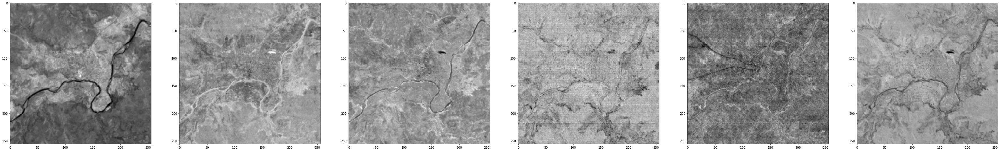

In [16]:
# Capteur normal:
path_img = 'Landstat_Kedougou/landsatkedougouC'
n_bands = 6

img = load_image(path_img +'1')

img = np.zeros((img.shape[0], img.shape[1], n_bands))
# Stacking up images into the numpy array:
c = []
for i in range(n_bands):
    c.append(load_image(path_img + str(i + 1)))

for i in range(img.shape[0]):
    for j in range(img.shape[1]):
        for k in range(n_bands):
            img[i][j][k] = c[k][i][j]
            
# Reshape the image for practicality:
for i in range(n_bands):
    c[i] = c[i].reshape((1, c[i].shape[0]*c[i].shape[1]))
    
# Standardization:
m = []
s = []

for i in range(n_bands):
    m.append(np.mean(c[i]))
    s.append(np.std(c[i]))
    c[i] = (c[i] - m[i])/s[i]
    
# Compute the covariance matrix:
mat = np.zeros((n_bands, c[0].shape[0]*c[0].shape[1]))
for i in range(n_bands):
    mat[i] = c[i]
mcov = np.cov(mat)

# Compute eigenvalues and vectors with eig:
eva, evect = np.linalg.eig(mcov)

# Lets sort the eigenvalues to be able to choose the components by importance:
idx = np.argsort(eva)[::-1]
eva_sorted = eva[idx]
evect_sorted = evect[idx]
evect_sorted

# Lets get the components in separate matrices, so we can display them easily:
res = np.dot(mat.T, evect_sorted)
res = res.T
    
plt.figure(figsize=(n_bands*10, 12))

# Visualize them with imshow: 
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    plt.imshow(res[i].reshape((img.shape[0],img.shape[1])), cmap = 'gray')

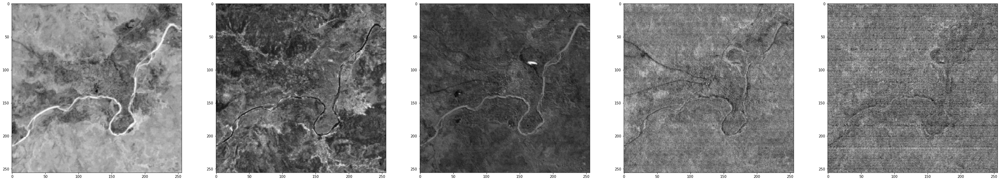

In [17]:
# Avec le bruit: 
img_b = load_image('Landstat_Kedougou/landsatkedougouC6bruit')
img = img_b 
img = np.zeros((img.shape[0], img.shape[1], n_bands))
n_bands = 5

# Stacking up images into the numpy array:
c = []
for i in range(n_bands):
    c.append(load_image(path_img + str(i + 1)))
c.append(img_b)
    
for i in range(img.shape[0]):
    for j in range(img.shape[1]):
        for k in range(n_bands):
            img[i][j][k] = c[k][i][j]
            
# Reshape the image for practicality:
for i in range(n_bands):
    c[i] = c[i].reshape((1, c[i].shape[0]*c[i].shape[1]))
    
# Standardization:
m = []
s = []

for i in range(n_bands):
    m.append(np.mean(c[i]))
    s.append(np.std(c[i]))
    c[i] = (c[i] - m[i])/s[i]
    
# Compute the covariance matrix:
mat = np.zeros((n_bands, c[0].shape[0]*c[0].shape[1]))
for i in range(n_bands):
    mat[i] = c[i]
mcov = np.cov(mat)

# Compute eigenvalues and vectors with eig:
eva, evect = np.linalg.eig(mcov)

# Lets sort the eigenvalues to be able to choose the components by importance:
idx = np.argsort(eva)[::-1]
eva_sorted = eva[idx]
evect_sorted = evect[idx]
evect_sorted

# Lets get the components in separate matrices, so we can display them easily:
res = np.dot(mat.T, evect_sorted)
res = res.T
    
plt.figure(figsize=(n_bands*10, 12))

# Visualize them with imshow: 
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    plt.imshow(res[i].reshape((img.shape[0],img.shape[1])), cmap = 'gray')

*L’effet lié au capteur n’est pas négligeable si on ne regarde que la première image puisqu’il y a 8% de différence entre les deux. Cependant, si on considère plusieurs images, son impact est limité (si on considère 3 images, il n’y a que 2.2% de différence : il faut donc toujours utiliser au moins 3 images pour conserver 90% de l’information).*

### K-means

Dans cette partie, on souhaite réaliser un classificateur automatique pour réaliser une segmentation simple d'images : par exemple, pour séparer terres et rivière.
- Tracer l’histogramme canal par canal est instructif !
- La recherche de prototypes nécessite un peu de patience : il faut rechercher sur l’image les coordonnées de points dont on a pu (ou su) voir l’originalité.

**Classification rivière-terre**: Commencez par tester la procédure sur *SPOT* à l'aide des valeurs exemples pour l’eau et sur la terre. 

In [18]:
def histogramme(image):
    hist = np.zeros(256, dtype=np.float32)
    shap = image.shape
    for j in range(shap[0]):
        for i in range(shap[1]):
            valeur = image[j,i]
            hist[int(valeur)] += 1
    return hist

In [19]:
path_img = 'SPOT/cam' 
n_bands = 3 
size = 512 

c = []
for i in range(n_bands):
    c.append(load_image(path_img + str(i + 1)))

hist = [histogramme(canal) for canal in c]

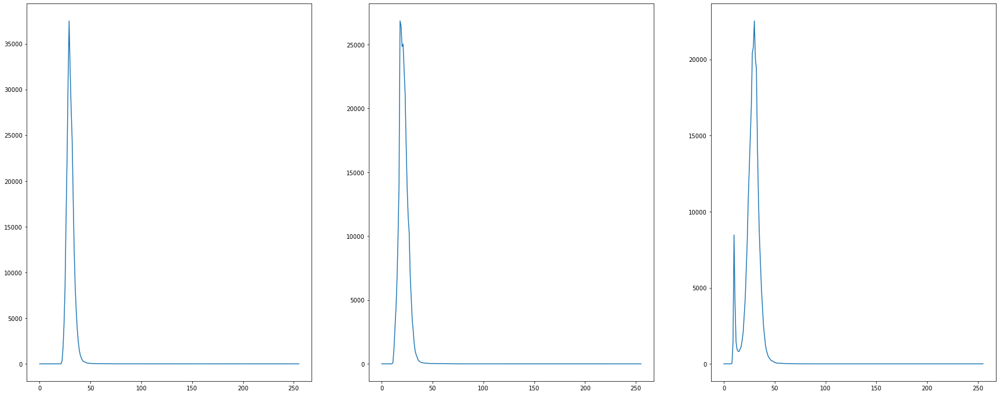

In [20]:
plt.figure(figsize=(n_bands*10, 12))

# Use the "histogramme" function to have an intuition of pixel repartition on each image
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    plt.plot(hist[i])

In [21]:
# Lieu du pixel caracteristique de l'eau
p1=[210, 150]
# Lieu du pixel caracteristique de la terre
p2=[50, 50]

Utilisez la classe ```KMeans``` de ```sklearn```. Choississez le nombre de classes avec ```n_clusters``` et les centres initiaux des classes avec ```init```. Enfin, faites tourner l'algorithme sur l'image choisie avec ```.fit()``` et obtenez les classes de chaque pixel avec ```.predict()```. 
N'oubliez pas d'adapter la structure des données: nous n'avons ici qu'un exemple pour la procédure (un seul canal) avec un grand nombre de caractéristiques à classer (les pixels) - choississez les tailles de vos entrées en conséquence ! 

C:\Users\aurc\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
C:\Users\aurc\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
C:\Users\aurc\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


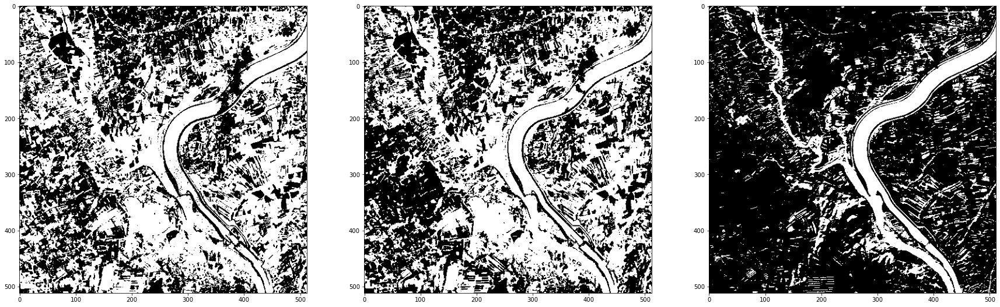

In [22]:
from sklearn.cluster import KMeans
plt.figure(figsize=(n_bands*10, 12))

water = []
earth = []
for i in range(n_bands):
    water.append(c[i][p1[0]][p1[1]])
    earth.append(c[i][p2[0]][p2[1]])
    ini = np.array([[water[i]], [earth[i]]])
    kmeans = KMeans(n_clusters = 2, init = ini).fit(c[i].reshape((c[i].shape[0]*c[i].shape[1],1)))
    plt.subplot(1,n_bands,i+1)
    plt.imshow(kmeans.labels_.reshape((c[i].shape[0], c[i].shape[1])), cmap = 'gray')


Faites de même avec les deux autres images. Avec quels canaux pouvez vous obtenir les meilleures segmentation ? Jusqu'à combien de classes ? 

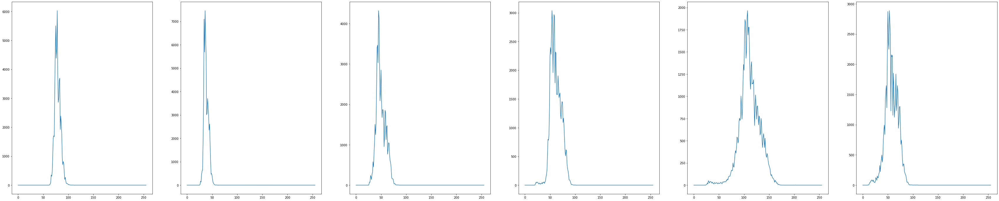

In [23]:
path_img = 'Landstat_Kedougou/landsatkedougouC' 
n_bands = 6 
size = 256

c = []
for i in range(n_bands):
    c.append(load_image(path_img + str(i + 1)))

hist = [histogramme(canal) for canal in c]

plt.figure(figsize=(n_bands*10, 12))

# Use the "histogramme" function to have an intuition of pixel repartition on each image
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    plt.plot(hist[i])

Plutôt que de rechercher des points dans l'eau et sur la terre à la main, nous avons décidé d'utiliser l'initialisation de kmeans++.

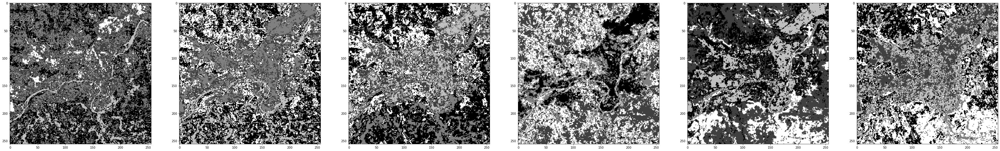

In [24]:
plt.figure(figsize=(n_bands*10, 12))

for i in range(n_bands):
    kmeans = KMeans(n_clusters = 5).fit(c[i].reshape((c[i].shape[0]*c[i].shape[1],1)))
    plt.subplot(1,n_bands,i+1)
    plt.imshow(kmeans.labels_.reshape((c[i].shape[0], c[i].shape[1])), cmap = 'gray')


Cinq clusters semble être le choix optimal, notamment pour les clusters 1 et 5.

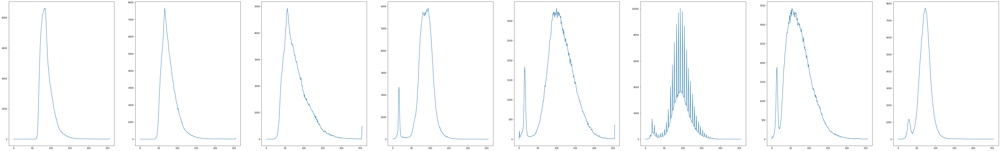

In [25]:
path_img = 'Landstat_Tarascon/landsattarasconC' 
n_bands = 8 
size = 512

c = []
for i in range(n_bands):
    c.append(load_image(path_img + str(i + 1)))

hist = [histogramme(canal) for canal in c]

plt.figure(figsize=(n_bands*10, 12))

# Use the "histogramme" function to have an intuition of pixel repartition on each image
for i in range(n_bands):
    plt.subplot(1,n_bands,i+1)
    plt.plot(hist[i])

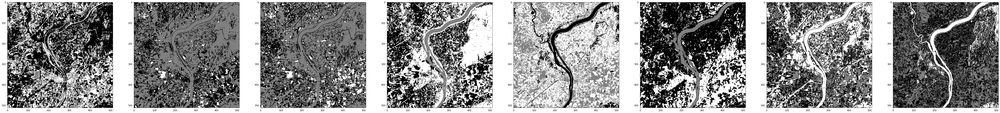

In [26]:
plt.figure(figsize=(n_bands*10, 12))

for i in range(n_bands):
    kmeans = KMeans(n_clusters = 3).fit(c[i].reshape((c[i].shape[0]*c[i].shape[1],1)))
    plt.subplot(1,n_bands,i+1)
    plt.imshow(kmeans.labels_.reshape((c[i].shape[0], c[i].shape[1])), cmap = 'gray')

Le clustering semble cette fois optimal pour les canaux 5 et 8 en choisissant trois clusters.